In [1]:
### Import the required libraries
import numpy as np
import scipy
import matplotlib.pyplot as plt
import cmocean

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter("ignore")

import tensorflow as tf
import tensorflow.keras as keras
from keras import metrics
import innvestigate

import os
from os.path import join
import sys

import xarray as xr
import xmitgcm
from xmitgcm import open_mdsdataset
import ecco_v4_py as ecco

import random

# See if GPUs are available
from keras import backend as K
if bool(K._get_available_gpus()):
    print("Running on GPU")
else:
    print("Running on CPU")

# Append to sys.path the absolute path to src/XAIRT
path_list = os.path.abspath('').split('/')
path_src_XAIRT = ''
for link in path_list[:-1]:
    path_src_XAIRT = path_src_XAIRT+link+'/'
sys.path.append(path_src_XAIRT+'/src')

# Now import module XAIRT
from XAIRT import *

### https://stackoverflow.com/questions/36288235/how-to-get-stable-results-with-tensorflow-setting-random-seed ###
### https://keras.io/examples/keras_recipes/reproducibility_recipes/ ###
SEED = 42
keras.utils.set_random_seed(SEED)
tf.config.experimental.enable_op_determinism()

tf.compat.v1.disable_eager_execution()

2024-01-29 00:41:15.033653: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-29 00:41:16.522011: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38221 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:21:00.0, compute capability: 8.0
2024-01-29 00:41:16.525087: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 38221 MB memory:  -> device: 1, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:81:00.0, compute capability: 8.0
2024-01-29 00:41:16.527541: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/rep

Running on GPU


In [2]:
### Sverdrup 
# mainDir  = '/scratch2/pillarh/eccov4r4'
# gridDir  = mainDir + '/GRID'
# thetaDir = mainDir + '/eccov4r4_nctiles_daily/THETA'

### Lonestar6
mainDir  = '/work/07665/shrey911/ls6/LRP_eccov4r4_data'
gridDir  = mainDir
thetaDir = mainDir

In [3]:
### Sverdrup  - /scratch2/shreyas/LRP_eccov4r4_data
### Lonestar6 - /work/07665/shrey911/ls6/LRP_eccov4r4_data

ds = xr.open_dataset(f'/work/07665/shrey911/ls6/LRP_eccov4r4_data/thetaSurfECCOv4r4.nc')

In [4]:
hFacC = ecco.read_llc_to_tiles(gridDir, 'hFacC.data')
hFacC_mask = hFacC > 0
hFacC_mask = hFacC_mask.astype(float)

XC = ds['XC'].data
YC = ds['YC'].data

latMask = YC > -20.0
latMask = latMask.astype(float)

maskFinal = hFacC_mask * latMask
NaNmaskFinal = np.copy(maskFinal)
NaNmaskFinal[NaNmaskFinal == 0] = np.nan

da_hFacC_mask = xr.DataArray(
    data=hFacC_mask,
    dims=["tile", "j", "i"],
    coords=dict(
        tile = ds['tile'].data,
        j    = ds['j'].data,
        i    = ds['i'].data,
    ),
    attrs=dict(description="hFacC mask 2D 1 if > 0, else 0"),
)

da_latMask = xr.DataArray(
    data=latMask,
    dims=["tile", "j", "i"],
    coords=dict(
        tile = ds['tile'].data,
        j    = ds['j'].data,
        i    = ds['i'].data,
    ),
    attrs=dict(description="Latitude Mask 1 if > -20, else 0"),
)

da_maskFinal = xr.DataArray(
    data=maskFinal,
    dims=["tile", "j", "i"],
    coords=dict(
        tile = ds['tile'].data,
        j    = ds['j'].data,
        i    = ds['i'].data,
    ),
    attrs=dict(description="Mask 2D 1 if > 0, else 0"),
)

da_NaNmaskFinal = xr.DataArray(
    data=NaNmaskFinal,
    dims=["tile", "j", "i"],
    coords=dict(
        tile = ds['tile'].data,
        j    = ds['j'].data,
        i    = ds['i'].data,
    ),
    attrs=dict(description="Mask 2D True if > 0, else NaN"),
)

wetpoints = np.nonzero(maskFinal.data)
da_wetpoints = xr.DataArray(
    data=np.asarray(wetpoints),
    dims=["wetpoints_dim", "num_wetpoints"],
    coords=dict(
        wetpoints_dim = np.arange(np.asarray(wetpoints).shape[0], dtype = int),
        num_wetpoints = np.arange(np.asarray(wetpoints).shape[1], dtype = int),
    ),
    attrs=dict(description="indices of wetpoints in the order (tile, j, i) in the three rows"),
)

ds = ds.assign(hFacC_mask   = da_hFacC_mask,
          latMask      = da_latMask,
          maskFinal    = da_maskFinal,
          NaNmaskFinal = da_NaNmaskFinal,
          wetpoints    = da_wetpoints)

load_binary_array: loading file /work/07665/shrey911/ls6/LRP_eccov4r4_data/hFacC.data
load_binary_array: data array shape  (1170, 90)
load_binary_array: data array type  >f4
llc_compact_to_faces: dims, llc  (1170, 90) 90
llc_compact_to_faces: data_compact array type  >f4
llc_faces_to_tiles: data_tiles shape  (13, 90, 90)
llc_faces_to_tiles: data_tiles dtype  >f4


In [5]:
def anomalize(field):
    
    leap_yr_offsets_jan_feb   = [0,1,1,1,1,2,2,2,2,3,3,3,3,4,4,4,4,5,5,5,5,6,6,6,6,7]
    leap_yr_offsets_after_feb = [1,1,1,1,2,2,2,2,3,3,3,3,4,4,4,4,5,5,5,5,6,6,6,6,7,7]

    if len(field.shape) > 1:
        seasonal_trend = np.zeros((366, field.shape[1]))
    else:
        seasonal_trend = np.zeros((366,))

    #### Calculate seasonal trend
    
    # Jan 1 - Feb 28
    for d in range(59):
        for year in range(26):
            seasonal_trend[d] += field[d+365*year+leap_yr_offsets_jan_feb[year]]
    seasonal_trend[:59] = seasonal_trend[:59] / 26.0
    
    # Feb 29 starting 1996, so year 2 in 0-indefielding
    n = 0
    for year in range(0,26,4):
        seasonal_trend[59] += field[365*year+n+59]
        n = n+1
    seasonal_trend[59] = seasonal_trend[59] / 7.0
            
    # Mar 1 - Dec 31
    for d in range(60,366):
        for year in range(26):
            seasonal_trend[d] += field[d-1+365*year+leap_yr_offsets_after_feb[year]]
    seasonal_trend[60:] = seasonal_trend[60:] / 26.0
    
    #### Deseason data
    
    # Jan 1 - Feb 28
    for d in range(59):
        for year in range(26):
            field[d+365*year+leap_yr_offsets_jan_feb[year]] = field[d+365*year+leap_yr_offsets_jan_feb[year]] \
                                                        - seasonal_trend[d]
    
    # Feb 29 starting 1996, so year 2 in 0-indexing
    n = 0
    for year in range(0,26,4):
        field[365*year+n+59] = field[365*year+n+59] - seasonal_trend[59]
        n = n+1
            
    # Mar 1 - Dec 31
    for d in range(60,366):
        for year in range(26):
            field[d-1+365*year+leap_yr_offsets_after_feb[year]] = field[d-1+365*year+leap_yr_offsets_after_feb[year]] \
                                                            - seasonal_trend[d]

    scipy.signal.detrend(field, axis=0, type='linear', bp=0, overwrite_data=True)
    field = field - np.mean(field, axis = 0)

    return field

In [6]:
X = ds['THETA'].data[:,wetpoints[0],wetpoints[1],wetpoints[2]].copy()
X = anomalize(X)
X_full = X.copy()
X = X[30:-30]

y = ds['THETA'].isel(tile = 10, j = 1, i = 43).data.copy()
y = anomalize(y)
# https://stackoverflow.com/questions/13728392/moving-average-or-running-mean
y = np.convolve(y, np.ones(61)/61, mode='valid')
oneHotCost = np.zeros((y.shape[0], 2), dtype = int)
oneHotCost[:,0] = y >= 0.0
oneHotCost[:,1] = y <  0.0

In [7]:
da_X = xr.DataArray(
    data=X,
    dims=["time_allData", "num_wetpoints"],
    coords=dict(
        time_allData  = ds['time'].data[30:-30],
        num_wetpoints = ds['num_wetpoints'].data,
    ),
    attrs=dict(description="All data as matrix X; deseasoned, delinearized and mean removed."),
)

da_y = xr.DataArray(
    data=y,
    dims=["time_allData"],
    coords=dict(
        time_allData  = ds['time'].data[30:-30],
    ),
    attrs=dict(description="All cost function y; deseasoned, delinearized and mean removed."),
)

da_X_full = xr.DataArray(
    data=X_full,
    dims=["time", "num_wetpoints"],
    coords=dict(
        time          = ds['time'],
        num_wetpoints = ds['num_wetpoints'].data,
    ),
    attrs=dict(description="All data without accounting for conv filter as matrix X_full; deseasoned, delinearized and mean removed."),
)

da_oneHotCost = xr.DataArray(
    data=oneHotCost,
    dims=["time_allData", "NN_output_dim"],
    coords=dict(
        time_allData  = ds['time'].data[30:-30],
        NN_output_dim = np.array([0,1]),
    ),
    attrs=dict(description="All cost function as one-hot vector."),
)

ds = ds.assign(X          = da_X,
               y          = da_y,
               X_full     = da_X_full,
               oneHotCost = da_oneHotCost)

## Classification

In [8]:
def LRP(model, model_wo_softmax, X, y_true, lagSteps, lrp_methods, 
        suffix, normalizeDict, **kwargs):

    result = {}
    cost_NN = model.predict(X)
    result[f'score_{suffix}'] = model.evaluate(X, y_true, verbose=0)

    pred_NN = cost_NN.copy()
    pred_NN[:,0] = pred_NN[:,0] > 0.5
    pred_NN[:,1] = pred_NN[:,1] > 0.5

    idx_NN_pos = []
    idx_NN_neg = []

    if lagSteps >= 0:
        for i in range(len(y_true[lagSteps:,0])):
            if y_true[lagSteps+i,0] == 1 and pred_NN[i,0] == 1:
                idx_NN_pos.append(i)
            if y_true[lagSteps+i,1] == 1 and pred_NN[i,1] == 1:
                idx_NN_neg.append(i)
    else:
        for i in range(len(y_true[:lagSteps,0])):
            if y_true[i,0] == 1 and pred_NN[i-lagSteps,0] == 1:
                idx_NN_pos.append(i-lagSteps)
            if y_true[i,1] == 1 and pred_NN[i-lagSteps,1] == 1:
                idx_NN_neg.append(i-lagSteps)    

    rel = np.zeros((len(idx_NN_pos), 13, 90, 90))
    rel[:,:,:,:] = np.nan
    rel[:,wetpoints[0],wetpoints[1],wetpoints[2]] = X[idx_NN_pos]
    result[f'samples_correct_pos_{suffix}'] = rel

    rel = np.zeros((len(idx_NN_neg), 13, 90, 90))
    rel[:,:,:,:] = np.nan
    rel[:,wetpoints[0],wetpoints[1],wetpoints[2]] = X[idx_NN_neg]
    result[f'samples_correct_neg_{suffix}'] = rel
    
    for method in lrp_methods:

        title = method['title']
        
        print(f'Analyze using {title} for {suffix} data')
        
        Xplain = XAIR(model_wo_softmax, method, 'classic', X[idx_NN_pos], 
                      normalizeDict, **kwargs)
        a, _  = Xplain.quick_analyze()
        
        rel = np.zeros((a.shape[0], 13, 90, 90))
        rel[:,:,:,:] = np.nan
        rel[:,wetpoints[0],wetpoints[1],wetpoints[2]] = a
        result[method['title']+f'_pos_{suffix}'] = rel

        Xplain = XAIR(model_wo_softmax, method, 'classic', X[idx_NN_neg], 
                      normalizeDict, **kwargs)
        a, _  = Xplain.quick_analyze()
        
        rel = np.zeros((a.shape[0], 13, 90, 90))
        rel[:,:,:,:] = np.nan
        rel[:,wetpoints[0],wetpoints[1],wetpoints[2]] = a
        result[method['title']+f'_neg_{suffix}'] = rel

    return result

def quickSetup(X, y,
               test_split_frac,
               lrp_methods,
               lagSteps,
               decay_func = None,
               **NNkwargs):
    
    result = {}

    idx = int(X.shape[0]*(1-test_split_frac))
    X_train = X[:idx]
    oneHotCost_train = oneHotCost[:idx]
    X_test = X[idx:]
    oneHotCost_test = oneHotCost[idx:]

    keras.backend.clear_session()
    sgd = keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=True)
    NNkwargs['optimizer'] = sgd
    
    if lagSteps > 0:
        K = TrainFullyConnectedNN(X_train[:-lagSteps], oneHotCost_train[lagSteps:], **NNkwargs)
    elif lagSteps == 0:
        K = TrainFullyConnectedNN(X_train, oneHotCost_train, **NNkwargs)
    else:
        K = TrainFullyConnectedNN(X_train[-lagSteps:], oneHotCost_train[:lagSteps], **NNkwargs)
        
    best_model = K.quickTrain(decay_func)
    best_model_wo_softmax = innvestigate.model_wo_softmax(best_model)
                   
    result['cost_predict_NN'] = best_model.predict(X)
                   
    normalizeDict = {'bool_': True, 'kind': 'MaxAbs'}
    kwargs = {'y_ref': 0.00}

    # LRP for all data
    result_train = LRP(best_model, best_model_wo_softmax, 
                       X, oneHotCost, lagSteps, lrp_methods, 
                       suffix = 'all', normalizeDict = normalizeDict, **kwargs)
    result.update(result_train)
    
    # LRP for training data
    result_train = LRP(best_model, best_model_wo_softmax, 
                       X_train, oneHotCost_train, lagSteps, lrp_methods, 
                       suffix = 'train', normalizeDict = normalizeDict, **kwargs)
    result.update(result_train)

    # LRP for test data
    result_test = LRP(best_model, best_model_wo_softmax, 
                       X_test, oneHotCost_test, lagSteps, lrp_methods, 
                       suffix = 'test', normalizeDict = normalizeDict, **kwargs)
    result.update(result_test)
        
    return result

In [9]:
Layers = [{'size': X.shape[1], 'activation': None     , 'use_bias': None},
          {'size': 8         , 'activation': 'relu'   , 'use_bias': True, 'l2_w_reg': 10  , 'l2_b_reg': 10},
          {'size': 8         , 'activation': 'relu'   , 'use_bias': True, 'l2_w_reg': 0.01, 'l2_b_reg': 0.01},
          {'size': 2         , 'activation': 'softmax', 'use_bias': True, 'l2_w_reg': 0.01, 'l2_b_reg': 0.01}]
Losses = [{'kind': 'categorical_crossentropy', 'weight': 1.0}]

LRPDict_theta = {}
lagStepsList = [-60,-30,0,30,60,90,120,150,180]

# learning rate schedule
def step_decay(epoch):
    initial_lrate = 0.01
    drop = 0.5
    epochs_drop = 25
    lrate = initial_lrate * drop**np.floor((1+epoch)/epochs_drop)
    return lrate

methods = [dict(name='lrp.z', title = 'LRP-Z', optParams = {}),
           dict(name='lrp.z', title = 'LRP-Z-W2', optParams = {'input_layer_rule':'WSquare'}),
           dict(name='lrp.z', title = 'LRP-Z-B', optParams = {'input_layer_rule':'Bounded'})]

cmaps = ['RdBu_r', 'RdBu_r', 'RdBu_r']
color_ranges = [[-0.5,0.5], [-0.3,0.3], [-0.5,0.5]]

In [10]:
for i in range(len(lagStepsList)):

    print(f'Lag: {lagStepsList[i]} days, for Theta')
    
    NNkwargs = {'losses': Losses, 'metrics': [metrics.categorical_accuracy],
                'batch_size': 128, 'epochs': 100, 'validation_split': 0.2,
                'filename': f'model{lagStepsList[i]}', 'dirname': os.path.abspath(''),
                'random_nn_seed': 42}
    
    LRPDict_theta[f'LRP{lagStepsList[i]}'] = quickSetup(X, y, test_split_frac = 1.0/3.0,
                                                        lrp_methods = methods,
                                                        lagSteps = lagStepsList[i],
                                                        decay_func = step_decay,
                                                        layers = Layers, **NNkwargs)

Lag: -60 days, for Theta


2024-01-29 00:41:21.546256: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38221 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:21:00.0, compute capability: 8.0
2024-01-29 00:41:21.548302: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 38221 MB memory:  -> device: 1, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:81:00.0, compute capability: 8.0
2024-01-29 00:41:21.550253: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 38221 MB memory:  -> device: 2, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:e2:00.0, compute capability: 8.0
2024-01-29 00:41:21.562468: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:354] MLIR V1 optimization pass is not enabled
2024-01-29 00:41:22.458863: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] Ten


Epoch 1: val_loss improved from inf to 0.87181, saving model to /home1/07665/shrey911/XAIRT/examples/model-60.h5

Epoch 2: val_loss did not improve from 0.87181

Epoch 3: val_loss did not improve from 0.87181

Epoch 4: val_loss improved from 0.87181 to 0.80439, saving model to /home1/07665/shrey911/XAIRT/examples/model-60.h5

Epoch 5: val_loss did not improve from 0.80439

Epoch 6: val_loss did not improve from 0.80439

Epoch 7: val_loss did not improve from 0.80439

Epoch 8: val_loss improved from 0.80439 to 0.79776, saving model to /home1/07665/shrey911/XAIRT/examples/model-60.h5

Epoch 9: val_loss did not improve from 0.79776

Epoch 10: val_loss did not improve from 0.79776

Epoch 11: val_loss did not improve from 0.79776

Epoch 12: val_loss did not improve from 0.79776

Epoch 13: val_loss improved from 0.79776 to 0.75633, saving model to /home1/07665/shrey911/XAIRT/examples/model-60.h5

Epoch 14: val_loss did not improve from 0.75633

Epoch 15: val_loss did not improve from 0.7563

2024-01-29 00:42:33.667818: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38221 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:21:00.0, compute capability: 8.0
2024-01-29 00:42:33.669879: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 38221 MB memory:  -> device: 1, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:81:00.0, compute capability: 8.0
2024-01-29 00:42:33.671845: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 38221 MB memory:  -> device: 2, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:e2:00.0, compute capability: 8.0



Epoch 1: val_loss improved from inf to 1.07118, saving model to /home1/07665/shrey911/XAIRT/examples/model-30.h5

Epoch 2: val_loss did not improve from 1.07118

Epoch 3: val_loss improved from 1.07118 to 1.04697, saving model to /home1/07665/shrey911/XAIRT/examples/model-30.h5

Epoch 4: val_loss did not improve from 1.04697

Epoch 5: val_loss improved from 1.04697 to 1.02556, saving model to /home1/07665/shrey911/XAIRT/examples/model-30.h5

Epoch 6: val_loss improved from 1.02556 to 0.87020, saving model to /home1/07665/shrey911/XAIRT/examples/model-30.h5

Epoch 7: val_loss did not improve from 0.87020

Epoch 8: val_loss did not improve from 0.87020

Epoch 9: val_loss improved from 0.87020 to 0.79425, saving model to /home1/07665/shrey911/XAIRT/examples/model-30.h5

Epoch 10: val_loss did not improve from 0.79425

Epoch 11: val_loss did not improve from 0.79425

Epoch 12: val_loss did not improve from 0.79425

Epoch 13: val_loss did not improve from 0.79425

Epoch 14: val_loss improv

2024-01-29 00:43:48.034069: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38221 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:21:00.0, compute capability: 8.0
2024-01-29 00:43:48.036135: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 38221 MB memory:  -> device: 1, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:81:00.0, compute capability: 8.0
2024-01-29 00:43:48.038098: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 38221 MB memory:  -> device: 2, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:e2:00.0, compute capability: 8.0



Epoch 1: val_loss improved from inf to 1.61976, saving model to /home1/07665/shrey911/XAIRT/examples/model0.h5

Epoch 2: val_loss improved from 1.61976 to 0.89980, saving model to /home1/07665/shrey911/XAIRT/examples/model0.h5

Epoch 3: val_loss improved from 0.89980 to 0.85260, saving model to /home1/07665/shrey911/XAIRT/examples/model0.h5

Epoch 4: val_loss did not improve from 0.85260

Epoch 5: val_loss did not improve from 0.85260

Epoch 6: val_loss did not improve from 0.85260

Epoch 7: val_loss did not improve from 0.85260

Epoch 8: val_loss did not improve from 0.85260

Epoch 9: val_loss improved from 0.85260 to 0.73631, saving model to /home1/07665/shrey911/XAIRT/examples/model0.h5

Epoch 10: val_loss did not improve from 0.73631

Epoch 11: val_loss improved from 0.73631 to 0.71820, saving model to /home1/07665/shrey911/XAIRT/examples/model0.h5

Epoch 12: val_loss did not improve from 0.71820

Epoch 13: val_loss improved from 0.71820 to 0.67484, saving model to /home1/07665/sh

2024-01-29 00:45:02.888331: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38221 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:21:00.0, compute capability: 8.0
2024-01-29 00:45:02.890390: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 38221 MB memory:  -> device: 1, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:81:00.0, compute capability: 8.0
2024-01-29 00:45:02.892355: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 38221 MB memory:  -> device: 2, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:e2:00.0, compute capability: 8.0



Epoch 1: val_loss improved from inf to 1.05082, saving model to /home1/07665/shrey911/XAIRT/examples/model30.h5

Epoch 2: val_loss did not improve from 1.05082

Epoch 3: val_loss did not improve from 1.05082

Epoch 4: val_loss did not improve from 1.05082

Epoch 5: val_loss did not improve from 1.05082

Epoch 6: val_loss improved from 1.05082 to 0.90529, saving model to /home1/07665/shrey911/XAIRT/examples/model30.h5

Epoch 7: val_loss did not improve from 0.90529

Epoch 8: val_loss did not improve from 0.90529

Epoch 9: val_loss did not improve from 0.90529

Epoch 10: val_loss did not improve from 0.90529

Epoch 11: val_loss did not improve from 0.90529

Epoch 12: val_loss did not improve from 0.90529

Epoch 13: val_loss did not improve from 0.90529

Epoch 14: val_loss did not improve from 0.90529

Epoch 15: val_loss did not improve from 0.90529

Epoch 16: val_loss did not improve from 0.90529

Epoch 17: val_loss improved from 0.90529 to 0.86336, saving model to /home1/07665/shrey911

2024-01-29 00:46:20.737580: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38221 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:21:00.0, compute capability: 8.0
2024-01-29 00:46:20.739638: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 38221 MB memory:  -> device: 1, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:81:00.0, compute capability: 8.0
2024-01-29 00:46:20.741595: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 38221 MB memory:  -> device: 2, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:e2:00.0, compute capability: 8.0



Epoch 1: val_loss improved from inf to 1.11079, saving model to /home1/07665/shrey911/XAIRT/examples/model60.h5

Epoch 2: val_loss improved from 1.11079 to 0.90988, saving model to /home1/07665/shrey911/XAIRT/examples/model60.h5

Epoch 3: val_loss did not improve from 0.90988

Epoch 4: val_loss did not improve from 0.90988

Epoch 5: val_loss did not improve from 0.90988

Epoch 6: val_loss did not improve from 0.90988

Epoch 7: val_loss did not improve from 0.90988

Epoch 8: val_loss improved from 0.90988 to 0.84917, saving model to /home1/07665/shrey911/XAIRT/examples/model60.h5

Epoch 9: val_loss did not improve from 0.84917

Epoch 10: val_loss did not improve from 0.84917

Epoch 11: val_loss did not improve from 0.84917

Epoch 12: val_loss did not improve from 0.84917

Epoch 13: val_loss did not improve from 0.84917

Epoch 14: val_loss did not improve from 0.84917

Epoch 15: val_loss did not improve from 0.84917

Epoch 16: val_loss did not improve from 0.84917

Epoch 17: val_loss di

2024-01-29 00:47:45.457155: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38221 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:21:00.0, compute capability: 8.0
2024-01-29 00:47:45.459210: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 38221 MB memory:  -> device: 1, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:81:00.0, compute capability: 8.0
2024-01-29 00:47:45.461168: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 38221 MB memory:  -> device: 2, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:e2:00.0, compute capability: 8.0



Epoch 1: val_loss improved from inf to 1.26581, saving model to /home1/07665/shrey911/XAIRT/examples/model90.h5

Epoch 2: val_loss improved from 1.26581 to 1.06288, saving model to /home1/07665/shrey911/XAIRT/examples/model90.h5

Epoch 3: val_loss did not improve from 1.06288

Epoch 4: val_loss did not improve from 1.06288

Epoch 5: val_loss improved from 1.06288 to 0.97278, saving model to /home1/07665/shrey911/XAIRT/examples/model90.h5

Epoch 6: val_loss did not improve from 0.97278

Epoch 7: val_loss did not improve from 0.97278

Epoch 8: val_loss did not improve from 0.97278

Epoch 9: val_loss did not improve from 0.97278

Epoch 10: val_loss improved from 0.97278 to 0.89237, saving model to /home1/07665/shrey911/XAIRT/examples/model90.h5

Epoch 11: val_loss did not improve from 0.89237

Epoch 12: val_loss improved from 0.89237 to 0.85357, saving model to /home1/07665/shrey911/XAIRT/examples/model90.h5

Epoch 13: val_loss did not improve from 0.85357

Epoch 14: val_loss did not imp

2024-01-29 00:49:05.770437: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38221 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:21:00.0, compute capability: 8.0
2024-01-29 00:49:05.772519: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 38221 MB memory:  -> device: 1, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:81:00.0, compute capability: 8.0
2024-01-29 00:49:05.774484: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 38221 MB memory:  -> device: 2, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:e2:00.0, compute capability: 8.0



Epoch 1: val_loss improved from inf to 0.92629, saving model to /home1/07665/shrey911/XAIRT/examples/model120.h5

Epoch 2: val_loss did not improve from 0.92629

Epoch 3: val_loss did not improve from 0.92629

Epoch 4: val_loss did not improve from 0.92629

Epoch 5: val_loss did not improve from 0.92629

Epoch 6: val_loss did not improve from 0.92629

Epoch 7: val_loss did not improve from 0.92629

Epoch 8: val_loss did not improve from 0.92629

Epoch 9: val_loss did not improve from 0.92629

Epoch 10: val_loss did not improve from 0.92629

Epoch 11: val_loss did not improve from 0.92629

Epoch 12: val_loss did not improve from 0.92629

Epoch 13: val_loss did not improve from 0.92629

Epoch 14: val_loss improved from 0.92629 to 0.84815, saving model to /home1/07665/shrey911/XAIRT/examples/model120.h5

Epoch 15: val_loss did not improve from 0.84815

Epoch 16: val_loss did not improve from 0.84815

Epoch 17: val_loss improved from 0.84815 to 0.78402, saving model to /home1/07665/shrey9

2024-01-29 00:50:24.980882: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38221 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:21:00.0, compute capability: 8.0
2024-01-29 00:50:24.982947: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 38221 MB memory:  -> device: 1, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:81:00.0, compute capability: 8.0
2024-01-29 00:50:24.984911: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 38221 MB memory:  -> device: 2, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:e2:00.0, compute capability: 8.0



Epoch 1: val_loss improved from inf to 1.28375, saving model to /home1/07665/shrey911/XAIRT/examples/model150.h5

Epoch 2: val_loss improved from 1.28375 to 1.03371, saving model to /home1/07665/shrey911/XAIRT/examples/model150.h5

Epoch 3: val_loss improved from 1.03371 to 0.91231, saving model to /home1/07665/shrey911/XAIRT/examples/model150.h5

Epoch 4: val_loss did not improve from 0.91231

Epoch 5: val_loss did not improve from 0.91231

Epoch 6: val_loss did not improve from 0.91231

Epoch 7: val_loss did not improve from 0.91231

Epoch 8: val_loss improved from 0.91231 to 0.84197, saving model to /home1/07665/shrey911/XAIRT/examples/model150.h5

Epoch 9: val_loss did not improve from 0.84197

Epoch 10: val_loss did not improve from 0.84197

Epoch 11: val_loss improved from 0.84197 to 0.81142, saving model to /home1/07665/shrey911/XAIRT/examples/model150.h5

Epoch 12: val_loss did not improve from 0.81142

Epoch 13: val_loss did not improve from 0.81142

Epoch 14: val_loss did no

2024-01-29 00:51:42.386244: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38221 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:21:00.0, compute capability: 8.0
2024-01-29 00:51:42.388316: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 38221 MB memory:  -> device: 1, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:81:00.0, compute capability: 8.0
2024-01-29 00:51:42.390278: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 38221 MB memory:  -> device: 2, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:e2:00.0, compute capability: 8.0



Epoch 1: val_loss improved from inf to 1.06181, saving model to /home1/07665/shrey911/XAIRT/examples/model180.h5

Epoch 2: val_loss did not improve from 1.06181

Epoch 3: val_loss did not improve from 1.06181

Epoch 4: val_loss did not improve from 1.06181

Epoch 5: val_loss improved from 1.06181 to 1.06155, saving model to /home1/07665/shrey911/XAIRT/examples/model180.h5

Epoch 6: val_loss did not improve from 1.06155

Epoch 7: val_loss did not improve from 1.06155

Epoch 8: val_loss improved from 1.06155 to 0.95580, saving model to /home1/07665/shrey911/XAIRT/examples/model180.h5

Epoch 9: val_loss did not improve from 0.95580

Epoch 10: val_loss did not improve from 0.95580

Epoch 11: val_loss did not improve from 0.95580

Epoch 12: val_loss did not improve from 0.95580

Epoch 13: val_loss improved from 0.95580 to 0.94405, saving model to /home1/07665/shrey911/XAIRT/examples/model180.h5

Epoch 14: val_loss did not improve from 0.94405

Epoch 15: val_loss did not improve from 0.9440

In [11]:
def LRP_normalize(field):
    field[np.where(field < 0)] = 0.0
    field = np.nanmean(field, axis=0)
    field = field / np.nanmax(np.abs(field))
    
    return xr.DataArray(field)

lrp_minus60_z_b_pos_train_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z-B_pos_train'].copy())
lrp_minus60_z_b_neg_train_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z-B_neg_train'].copy())
lrp_minus60_z_w2_pos_train_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z-W2_pos_train'].copy())
lrp_minus60_z_w2_neg_train_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z-W2_neg_train'].copy())
lrp_minus60_z_pos_train_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z_pos_train'].copy())
lrp_minus60_z_neg_train_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z_neg_train'].copy())
lrp_minus60_z_b_pos_test_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z-B_pos_test'].copy())
lrp_minus60_z_b_neg_test_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z-B_neg_test'].copy())
lrp_minus60_z_w2_pos_test_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z-W2_pos_test'].copy())
lrp_minus60_z_w2_neg_test_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z-W2_neg_test'].copy())
lrp_minus60_z_pos_test_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z_pos_test'].copy())
lrp_minus60_z_neg_test_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z_neg_test'].copy())
lrp_minus60_z_b_pos_all_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z-B_pos_all'].copy())
lrp_minus60_z_b_neg_all_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z-B_neg_all'].copy())
lrp_minus60_z_w2_pos_all_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z-W2_pos_all'].copy())
lrp_minus60_z_w2_neg_all_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z-W2_neg_all'].copy())
lrp_minus60_z_pos_all_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z_pos_all'].copy())
lrp_minus60_z_neg_all_da = LRP_normalize(LRPDict_theta['LRP-60']['LRP-Z_neg_all'].copy())

lrp_minus30_z_b_pos_train_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z-B_pos_train'].copy())
lrp_minus30_z_b_neg_train_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z-B_neg_train'].copy())
lrp_minus30_z_w2_pos_train_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z-W2_pos_train'].copy())
lrp_minus30_z_w2_neg_train_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z-W2_neg_train'].copy())
lrp_minus30_z_pos_train_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z_pos_train'].copy())
lrp_minus30_z_neg_train_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z_neg_train'].copy())
lrp_minus30_z_b_pos_test_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z-B_pos_test'].copy())
lrp_minus30_z_b_neg_test_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z-B_neg_test'].copy())
lrp_minus30_z_w2_pos_test_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z-W2_pos_test'].copy())
lrp_minus30_z_w2_neg_test_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z-W2_neg_test'].copy())
lrp_minus30_z_pos_test_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z_pos_test'].copy())
lrp_minus30_z_neg_test_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z_neg_test'].copy())
lrp_minus30_z_b_pos_all_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z-B_pos_all'].copy())
lrp_minus30_z_b_neg_all_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z-B_neg_all'].copy())
lrp_minus30_z_w2_pos_all_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z-W2_pos_all'].copy())
lrp_minus30_z_w2_neg_all_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z-W2_neg_all'].copy())
lrp_minus30_z_pos_all_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z_pos_all'].copy())
lrp_minus30_z_neg_all_da = LRP_normalize(LRPDict_theta['LRP-30']['LRP-Z_neg_all'].copy())

lrp_0_z_b_pos_train_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z-B_pos_train'].copy())
lrp_0_z_b_neg_train_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z-B_neg_train'].copy())
lrp_0_z_w2_pos_train_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z-W2_pos_train'].copy())
lrp_0_z_w2_neg_train_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z-W2_neg_train'].copy())
lrp_0_z_pos_train_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z_pos_train'].copy())
lrp_0_z_neg_train_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z_neg_train'].copy())
lrp_0_z_b_pos_test_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z-B_pos_test'].copy())
lrp_0_z_b_neg_test_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z-B_neg_test'].copy())
lrp_0_z_w2_pos_test_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z-W2_pos_test'].copy())
lrp_0_z_w2_neg_test_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z-W2_neg_test'].copy())
lrp_0_z_pos_test_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z_pos_test'].copy())
lrp_0_z_neg_test_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z_neg_test'].copy())
lrp_0_z_b_pos_all_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z-B_pos_all'].copy())
lrp_0_z_b_neg_all_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z-B_neg_all'].copy())
lrp_0_z_w2_pos_all_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z-W2_pos_all'].copy())
lrp_0_z_w2_neg_all_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z-W2_neg_all'].copy())
lrp_0_z_pos_all_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z_pos_all'].copy())
lrp_0_z_neg_all_da = LRP_normalize(LRPDict_theta['LRP0']['LRP-Z_neg_all'].copy())

lrp_30_z_b_pos_train_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z-B_pos_train'].copy())
lrp_30_z_b_neg_train_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z-B_neg_train'].copy())
lrp_30_z_w2_pos_train_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z-W2_pos_train'].copy())
lrp_30_z_w2_neg_train_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z-W2_neg_train'].copy())
lrp_30_z_pos_train_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z_pos_train'].copy())
lrp_30_z_neg_train_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z_neg_train'].copy())
lrp_30_z_b_pos_test_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z-B_pos_test'].copy())
lrp_30_z_b_neg_test_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z-B_neg_test'].copy())
lrp_30_z_w2_pos_test_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z-W2_pos_test'].copy())
lrp_30_z_w2_neg_test_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z-W2_neg_test'].copy())
lrp_30_z_pos_test_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z_pos_test'].copy())
lrp_30_z_neg_test_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z_neg_test'].copy())
lrp_30_z_b_pos_all_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z-B_pos_all'].copy())
lrp_30_z_b_neg_all_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z-B_neg_all'].copy())
lrp_30_z_w2_pos_all_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z-W2_pos_all'].copy())
lrp_30_z_w2_neg_all_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z-W2_neg_all'].copy())
lrp_30_z_pos_all_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z_pos_all'].copy())
lrp_30_z_neg_all_da = LRP_normalize(LRPDict_theta['LRP30']['LRP-Z_neg_all'].copy())

lrp_60_z_b_pos_train_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z-B_pos_train'].copy())
lrp_60_z_b_neg_train_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z-B_neg_train'].copy())
lrp_60_z_w2_pos_train_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z-W2_pos_train'].copy())
lrp_60_z_w2_neg_train_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z-W2_neg_train'].copy())
lrp_60_z_pos_train_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z_pos_train'].copy())
lrp_60_z_neg_train_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z_neg_train'].copy())
lrp_60_z_b_pos_test_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z-B_pos_test'].copy())
lrp_60_z_b_neg_test_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z-B_neg_test'].copy())
lrp_60_z_w2_pos_test_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z-W2_pos_test'].copy())
lrp_60_z_w2_neg_test_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z-W2_neg_test'].copy())
lrp_60_z_pos_test_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z_pos_test'].copy())
lrp_60_z_neg_test_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z_neg_test'].copy())
lrp_60_z_b_pos_all_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z-B_pos_all'].copy())
lrp_60_z_b_neg_all_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z-B_neg_all'].copy())
lrp_60_z_w2_pos_all_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z-W2_pos_all'].copy())
lrp_60_z_w2_neg_all_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z-W2_neg_all'].copy())
lrp_60_z_pos_all_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z_pos_all'].copy())
lrp_60_z_neg_all_da = LRP_normalize(LRPDict_theta['LRP60']['LRP-Z_neg_all'].copy())

lrp_90_z_b_pos_train_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z-B_pos_train'].copy())
lrp_90_z_b_neg_train_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z-B_neg_train'].copy())
lrp_90_z_w2_pos_train_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z-W2_pos_train'].copy())
lrp_90_z_w2_neg_train_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z-W2_neg_train'].copy())
lrp_90_z_pos_train_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z_pos_train'].copy())
lrp_90_z_neg_train_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z_neg_train'].copy())
lrp_90_z_b_pos_test_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z-B_pos_test'].copy())
lrp_90_z_b_neg_test_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z-B_neg_test'].copy())
lrp_90_z_w2_pos_test_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z-W2_pos_test'].copy())
lrp_90_z_w2_neg_test_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z-W2_neg_test'].copy())
lrp_90_z_pos_test_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z_pos_test'].copy())
lrp_90_z_neg_test_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z_neg_test'].copy())
lrp_90_z_b_pos_all_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z-B_pos_all'].copy())
lrp_90_z_b_neg_all_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z-B_neg_all'].copy())
lrp_90_z_w2_pos_all_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z-W2_pos_all'].copy())
lrp_90_z_w2_neg_all_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z-W2_neg_all'].copy())
lrp_90_z_pos_all_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z_pos_all'].copy())
lrp_90_z_neg_all_da = LRP_normalize(LRPDict_theta['LRP90']['LRP-Z_neg_all'].copy())

lrp_120_z_b_pos_train_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z-B_pos_train'].copy())
lrp_120_z_b_neg_train_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z-B_neg_train'].copy())
lrp_120_z_w2_pos_train_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z-W2_pos_train'].copy())
lrp_120_z_w2_neg_train_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z-W2_neg_train'].copy())
lrp_120_z_pos_train_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z_pos_train'].copy())
lrp_120_z_neg_train_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z_neg_train'].copy())
lrp_120_z_b_pos_test_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z-B_pos_test'].copy())
lrp_120_z_b_neg_test_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z-B_neg_test'].copy())
lrp_120_z_w2_pos_test_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z-W2_pos_test'].copy())
lrp_120_z_w2_neg_test_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z-W2_neg_test'].copy())
lrp_120_z_pos_test_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z_pos_test'].copy())
lrp_120_z_neg_test_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z_neg_test'].copy())
lrp_120_z_b_pos_all_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z-B_pos_all'].copy())
lrp_120_z_b_neg_all_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z-B_neg_all'].copy())
lrp_120_z_w2_pos_all_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z-W2_pos_all'].copy())
lrp_120_z_w2_neg_all_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z-W2_neg_all'].copy())
lrp_120_z_pos_all_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z_pos_all'].copy())
lrp_120_z_neg_all_da = LRP_normalize(LRPDict_theta['LRP120']['LRP-Z_neg_all'].copy())

lrp_150_z_b_pos_train_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z-B_pos_train'].copy())
lrp_150_z_b_neg_train_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z-B_neg_train'].copy())
lrp_150_z_w2_pos_train_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z-W2_pos_train'].copy())
lrp_150_z_w2_neg_train_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z-W2_neg_train'].copy())
lrp_150_z_pos_train_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z_pos_train'].copy())
lrp_150_z_neg_train_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z_neg_train'].copy())
lrp_150_z_b_pos_test_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z-B_pos_test'].copy())
lrp_150_z_b_neg_test_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z-B_neg_test'].copy())
lrp_150_z_w2_pos_test_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z-W2_pos_test'].copy())
lrp_150_z_w2_neg_test_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z-W2_neg_test'].copy())
lrp_150_z_pos_test_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z_pos_test'].copy())
lrp_150_z_neg_test_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z_neg_test'].copy())
lrp_150_z_b_pos_all_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z-B_pos_all'].copy())
lrp_150_z_b_neg_all_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z-B_neg_all'].copy())
lrp_150_z_w2_pos_all_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z-W2_pos_all'].copy())
lrp_150_z_w2_neg_all_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z-W2_neg_all'].copy())
lrp_150_z_pos_all_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z_pos_all'].copy())
lrp_150_z_neg_all_da = LRP_normalize(LRPDict_theta['LRP150']['LRP-Z_neg_all'].copy())

lrp_180_z_b_pos_train_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z-B_pos_train'].copy())
lrp_180_z_b_neg_train_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z-B_neg_train'].copy())
lrp_180_z_w2_pos_train_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z-W2_pos_train'].copy())
lrp_180_z_w2_neg_train_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z-W2_neg_train'].copy())
lrp_180_z_pos_train_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z_pos_train'].copy())
lrp_180_z_neg_train_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z_neg_train'].copy())
lrp_180_z_b_pos_test_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z-B_pos_test'].copy())
lrp_180_z_b_neg_test_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z-B_neg_test'].copy())
lrp_180_z_w2_pos_test_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z-W2_pos_test'].copy())
lrp_180_z_w2_neg_test_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z-W2_neg_test'].copy())
lrp_180_z_pos_test_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z_pos_test'].copy())
lrp_180_z_neg_test_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z_neg_test'].copy())
lrp_180_z_b_pos_all_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z-B_pos_all'].copy())
lrp_180_z_b_neg_all_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z-B_neg_all'].copy())
lrp_180_z_w2_pos_all_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z-W2_pos_all'].copy())
lrp_180_z_w2_neg_all_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z-W2_neg_all'].copy())
lrp_180_z_pos_all_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z_pos_all'].copy())
lrp_180_z_neg_all_da = LRP_normalize(LRPDict_theta['LRP180']['LRP-Z_neg_all'].copy())

In [12]:
ds_lrp = xr.Dataset()

ds_lrp = ds_lrp.assign(lrp_minus60_z_b_pos_train = lrp_minus60_z_b_pos_train_da,
                       lrp_minus60_z_b_neg_train = lrp_minus60_z_b_neg_train_da,
                       lrp_minus60_z_w2_pos_train = lrp_minus60_z_w2_pos_train_da,
                       lrp_minus60_z_w2_neg_train = lrp_minus60_z_w2_neg_train_da,
                       lrp_minus60_z_pos_train = lrp_minus60_z_pos_train_da,
                       lrp_minus60_z_neg_train = lrp_minus60_z_neg_train_da,
                       lrp_minus60_z_b_pos_test = lrp_minus60_z_b_pos_test_da,
                       lrp_minus60_z_b_neg_test = lrp_minus60_z_b_neg_test_da,
                       lrp_minus60_z_w2_pos_test = lrp_minus60_z_w2_pos_test_da,
                       lrp_minus60_z_w2_neg_test = lrp_minus60_z_w2_neg_test_da,
                       lrp_minus60_z_pos_test = lrp_minus60_z_pos_test_da,
                       lrp_minus60_z_neg_test = lrp_minus60_z_neg_test_da,
                       lrp_minus60_z_b_pos_all = lrp_minus60_z_b_pos_all_da,
                       lrp_minus60_z_b_neg_all = lrp_minus60_z_b_neg_all_da,
                       lrp_minus60_z_w2_pos_all = lrp_minus60_z_w2_pos_all_da,
                       lrp_minus60_z_w2_neg_all = lrp_minus60_z_w2_neg_all_da,
                       lrp_minus60_z_pos_all = lrp_minus60_z_pos_all_da,
                       lrp_minus60_z_neg_all = lrp_minus60_z_neg_all_da)

ds_lrp = ds_lrp.assign(lrp_minus30_z_b_pos_train = lrp_minus30_z_b_pos_train_da,
                       lrp_minus30_z_b_neg_train = lrp_minus30_z_b_neg_train_da,
                       lrp_minus30_z_b_pos_test = lrp_minus30_z_b_pos_test_da,
                       lrp_minus30_z_b_neg_test = lrp_minus30_z_b_neg_test_da,
                       lrp_minus30_z_w2_pos_train = lrp_minus30_z_w2_pos_train_da,
                       lrp_minus30_z_w2_neg_train = lrp_minus30_z_w2_neg_train_da,
                       lrp_minus30_z_w2_pos_test = lrp_minus30_z_w2_pos_test_da,
                       lrp_minus30_z_w2_neg_test = lrp_minus30_z_w2_neg_test_da,
                       lrp_minus30_z_pos_train = lrp_minus30_z_pos_train_da,
                       lrp_minus30_z_neg_train = lrp_minus30_z_neg_train_da,
                       lrp_minus30_z_pos_test = lrp_minus30_z_pos_test_da,
                       lrp_minus30_z_neg_test = lrp_minus30_z_neg_test_da,
                       lrp_minus30_z_b_pos_all = lrp_minus30_z_b_pos_all_da,
                       lrp_minus30_z_b_neg_all = lrp_minus30_z_b_neg_all_da,
                       lrp_minus30_z_w2_pos_all = lrp_minus30_z_w2_pos_all_da,
                       lrp_minus30_z_w2_neg_all = lrp_minus30_z_w2_neg_all_da,
                       lrp_minus30_z_pos_all = lrp_minus30_z_pos_all_da,
                       lrp_minus30_z_neg_all = lrp_minus30_z_neg_all_da)

ds_lrp = ds_lrp.assign(lrp_0_z_b_pos_train = lrp_0_z_b_pos_train_da,
                       lrp_0_z_b_neg_train = lrp_0_z_b_neg_train_da,
                       lrp_0_z_b_pos_test = lrp_0_z_b_pos_test_da,
                       lrp_0_z_b_neg_test = lrp_0_z_b_neg_test_da,
                       lrp_0_z_w2_pos_train = lrp_0_z_w2_pos_train_da,
                       lrp_0_z_w2_neg_train = lrp_0_z_w2_neg_train_da,
                       lrp_0_z_w2_pos_test = lrp_0_z_w2_pos_test_da,
                       lrp_0_z_w2_neg_test = lrp_0_z_w2_neg_test_da,
                       lrp_0_z_pos_train = lrp_0_z_pos_train_da,
                       lrp_0_z_neg_train = lrp_0_z_neg_train_da,
                       lrp_0_z_pos_test = lrp_0_z_pos_test_da,
                       lrp_0_z_neg_test = lrp_0_z_neg_test_da,
                       lrp_0_z_b_pos_all = lrp_0_z_b_pos_all_da,
                       lrp_0_z_b_neg_all = lrp_0_z_b_neg_all_da,
                       lrp_0_z_w2_pos_all = lrp_0_z_w2_pos_all_da,
                       lrp_0_z_w2_neg_all = lrp_0_z_w2_neg_all_da,
                       lrp_0_z_pos_all = lrp_0_z_pos_all_da,
                       lrp_0_z_neg_all = lrp_0_z_neg_all_da)

ds_lrp = ds_lrp.assign(lrp_30_z_b_pos_train = lrp_30_z_b_pos_train_da,
                       lrp_30_z_b_neg_train = lrp_30_z_b_neg_train_da,
                       lrp_30_z_b_pos_test = lrp_30_z_b_pos_test_da,
                       lrp_30_z_b_neg_test = lrp_30_z_b_neg_test_da,
                       lrp_30_z_w2_pos_train = lrp_30_z_w2_pos_train_da,
                       lrp_30_z_w2_neg_train = lrp_30_z_w2_neg_train_da,
                       lrp_30_z_w2_pos_test = lrp_30_z_w2_pos_test_da,
                       lrp_30_z_w2_neg_test = lrp_30_z_w2_neg_test_da,
                       lrp_30_z_pos_train = lrp_30_z_pos_train_da,
                       lrp_30_z_neg_train = lrp_30_z_neg_train_da,
                       lrp_30_z_pos_test = lrp_30_z_pos_test_da,
                       lrp_30_z_neg_test = lrp_30_z_neg_test_da,
                       lrp_30_z_b_pos_all = lrp_30_z_b_pos_all_da,
                       lrp_30_z_b_neg_all = lrp_30_z_b_neg_all_da,
                       lrp_30_z_w2_pos_all = lrp_30_z_w2_pos_all_da,
                       lrp_30_z_w2_neg_all = lrp_30_z_w2_neg_all_da,
                       lrp_30_z_pos_all = lrp_30_z_pos_all_da,
                       lrp_30_z_neg_all = lrp_30_z_neg_all_da)

ds_lrp = ds_lrp.assign(lrp_60_z_b_pos_train = lrp_60_z_b_pos_train_da,
                       lrp_60_z_b_neg_train = lrp_60_z_b_neg_train_da,
                       lrp_60_z_b_pos_test = lrp_60_z_b_pos_test_da,
                       lrp_60_z_b_neg_test = lrp_60_z_b_neg_test_da,
                       lrp_60_z_w2_pos_train = lrp_60_z_w2_pos_train_da,
                       lrp_60_z_w2_neg_train = lrp_60_z_w2_neg_train_da,
                       lrp_60_z_w2_pos_test = lrp_60_z_w2_pos_test_da,
                       lrp_60_z_w2_neg_test = lrp_60_z_w2_neg_test_da,
                       lrp_60_z_pos_train = lrp_60_z_pos_train_da,
                       lrp_60_z_neg_train = lrp_60_z_neg_train_da,
                       lrp_60_z_pos_test = lrp_60_z_pos_test_da,
                       lrp_60_z_neg_test = lrp_60_z_neg_test_da,
                       lrp_60_z_b_pos_all = lrp_60_z_b_pos_all_da,
                       lrp_60_z_b_neg_all = lrp_60_z_b_neg_all_da,
                       lrp_60_z_w2_pos_all = lrp_60_z_w2_pos_all_da,
                       lrp_60_z_w2_neg_all = lrp_60_z_w2_neg_all_da,
                       lrp_60_z_pos_all = lrp_60_z_pos_all_da,
                       lrp_60_z_neg_all = lrp_60_z_neg_all_da)

ds_lrp = ds_lrp.assign(lrp_90_z_b_pos_train = lrp_90_z_b_pos_train_da,
                       lrp_90_z_b_neg_train = lrp_90_z_b_neg_train_da,
                       lrp_90_z_b_pos_test = lrp_90_z_b_pos_test_da,
                       lrp_90_z_b_neg_test = lrp_90_z_b_neg_test_da,
                       lrp_90_z_w2_pos_train = lrp_90_z_w2_pos_train_da,
                       lrp_90_z_w2_neg_train = lrp_90_z_w2_neg_train_da,
                       lrp_90_z_w2_pos_test = lrp_90_z_w2_pos_test_da,
                       lrp_90_z_w2_neg_test = lrp_90_z_w2_neg_test_da,
                       lrp_90_z_pos_train = lrp_90_z_pos_train_da,
                       lrp_90_z_neg_train = lrp_90_z_neg_train_da,
                       lrp_90_z_pos_test = lrp_90_z_pos_test_da,
                       lrp_90_z_neg_test = lrp_90_z_neg_test_da,
                       lrp_90_z_b_pos_all = lrp_90_z_b_pos_all_da,
                       lrp_90_z_b_neg_all = lrp_90_z_b_neg_all_da,
                       lrp_90_z_w2_pos_all = lrp_90_z_w2_pos_all_da,
                       lrp_90_z_w2_neg_all = lrp_90_z_w2_neg_all_da,
                       lrp_90_z_pos_all = lrp_90_z_pos_all_da,
                       lrp_90_z_neg_all = lrp_90_z_neg_all_da)

ds_lrp = ds_lrp.assign(lrp_120_z_b_pos_train = lrp_120_z_b_pos_train_da,
                       lrp_120_z_b_neg_train = lrp_120_z_b_neg_train_da,
                       lrp_120_z_b_pos_test = lrp_120_z_b_pos_test_da,
                       lrp_120_z_b_neg_test = lrp_120_z_b_neg_test_da,
                       lrp_120_z_w2_pos_train = lrp_120_z_w2_pos_train_da,
                       lrp_120_z_w2_neg_train = lrp_120_z_w2_neg_train_da,
                       lrp_120_z_w2_pos_test = lrp_120_z_w2_pos_test_da,
                       lrp_120_z_w2_neg_test = lrp_120_z_w2_neg_test_da,
                       lrp_120_z_pos_train = lrp_120_z_pos_train_da,
                       lrp_120_z_neg_train = lrp_120_z_neg_train_da,
                       lrp_120_z_pos_test = lrp_120_z_pos_test_da,
                       lrp_120_z_neg_test = lrp_120_z_neg_test_da,
                       lrp_120_z_b_pos_all = lrp_120_z_b_pos_all_da,
                       lrp_120_z_b_neg_all = lrp_120_z_b_neg_all_da,
                       lrp_120_z_w2_pos_all = lrp_120_z_w2_pos_all_da,
                       lrp_120_z_w2_neg_all = lrp_120_z_w2_neg_all_da,
                       lrp_120_z_pos_all = lrp_120_z_pos_all_da,
                       lrp_120_z_neg_all = lrp_120_z_neg_all_da)

ds_lrp = ds_lrp.assign(lrp_150_z_b_pos_train = lrp_150_z_b_pos_train_da,
                       lrp_150_z_b_neg_train = lrp_150_z_b_neg_train_da,
                       lrp_150_z_b_pos_test = lrp_150_z_b_pos_test_da,
                       lrp_150_z_b_neg_test = lrp_150_z_b_neg_test_da,
                       lrp_150_z_w2_pos_train = lrp_150_z_w2_pos_train_da,
                       lrp_150_z_w2_neg_train = lrp_150_z_w2_neg_train_da,
                       lrp_150_z_w2_pos_test = lrp_150_z_w2_pos_test_da,
                       lrp_150_z_w2_neg_test = lrp_150_z_w2_neg_test_da,
                       lrp_150_z_pos_train = lrp_150_z_pos_train_da,
                       lrp_150_z_neg_train = lrp_150_z_neg_train_da,
                       lrp_150_z_pos_test = lrp_150_z_pos_test_da,
                       lrp_150_z_neg_test = lrp_150_z_neg_test_da,
                       lrp_150_z_b_pos_all = lrp_150_z_b_pos_all_da,
                       lrp_150_z_b_neg_all = lrp_150_z_b_neg_all_da,
                       lrp_150_z_w2_pos_all = lrp_150_z_w2_pos_all_da,
                       lrp_150_z_w2_neg_all = lrp_150_z_w2_neg_all_da,
                       lrp_150_z_pos_all = lrp_150_z_pos_all_da,
                       lrp_150_z_neg_all = lrp_150_z_neg_all_da)

ds_lrp = ds_lrp.assign(lrp_180_z_b_pos_train = lrp_180_z_b_pos_train_da,
                       lrp_180_z_b_neg_train = lrp_180_z_b_neg_train_da,
                       lrp_180_z_b_pos_test = lrp_180_z_b_pos_test_da,
                       lrp_180_z_b_neg_test = lrp_180_z_b_neg_test_da,
                       lrp_180_z_w2_pos_train = lrp_180_z_w2_pos_train_da,
                       lrp_180_z_w2_neg_train = lrp_180_z_w2_neg_train_da,
                       lrp_180_z_w2_pos_test = lrp_180_z_w2_pos_test_da,
                       lrp_180_z_w2_neg_test = lrp_180_z_w2_neg_test_da,
                       lrp_180_z_pos_train = lrp_180_z_pos_train_da,
                       lrp_180_z_neg_train = lrp_180_z_neg_train_da,
                       lrp_180_z_pos_test = lrp_180_z_pos_test_da,
                       lrp_180_z_neg_test = lrp_180_z_neg_test_da,
                       lrp_180_z_b_pos_all = lrp_180_z_b_pos_all_da,
                       lrp_180_z_b_neg_all = lrp_180_z_b_neg_all_da,
                       lrp_180_z_w2_pos_all = lrp_180_z_w2_pos_all_da,
                       lrp_180_z_w2_neg_all = lrp_180_z_w2_neg_all_da,
                       lrp_180_z_pos_all = lrp_180_z_pos_all_da,
                       lrp_180_z_neg_all = lrp_180_z_neg_all_da)

ds_lrp.to_netcdf('LRP_output_forHelen/LRP_Z.nc')

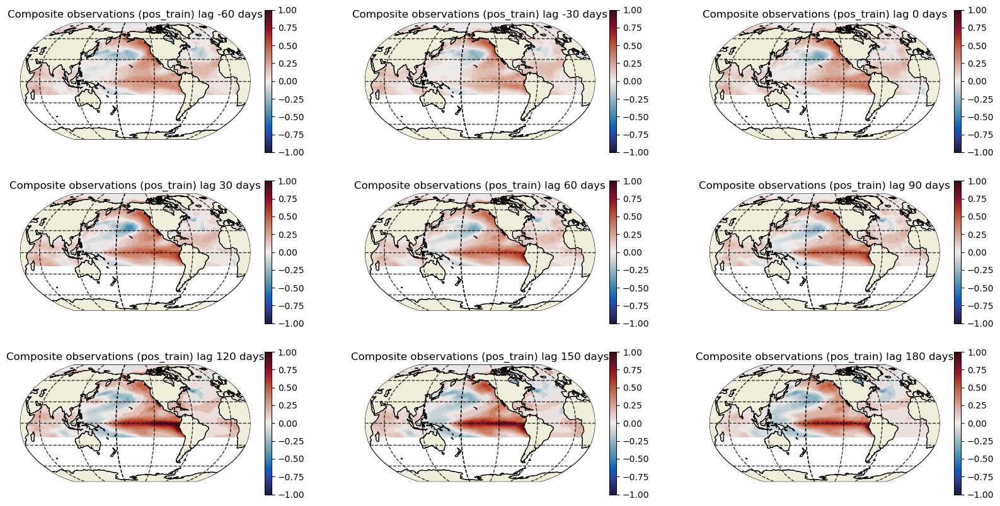

In [13]:
subplot_idx = 1
plt.rcParams["figure.figsize"] = (20,10)

for lag in lagStepsList:

    field = np.nanmean(LRPDict_theta[f'LRP{lag}']['samples_correct_pos_train'], axis=0)
    
    P = ecco.plot_proj_to_latlon_grid(ds.XC, ds.YC,
                                      field,
                                      plot_type = 'contourf',
                                      show_colorbar=True, cmap=cmocean.cm.balance, 
                                      cmin = -1, cmax = 1,
                                      user_lon_0 = -150,
                                      dx=2, dy=2, projection_type = 'robin',
                                      less_output = True, subplot_grid = [3,3,subplot_idx])

    P[1].set_title(f"Composite observations (pos_train) lag {lag} days")
    subplot_idx += 1

# plt.title("Composite observations (positive_train)")
plt.show()

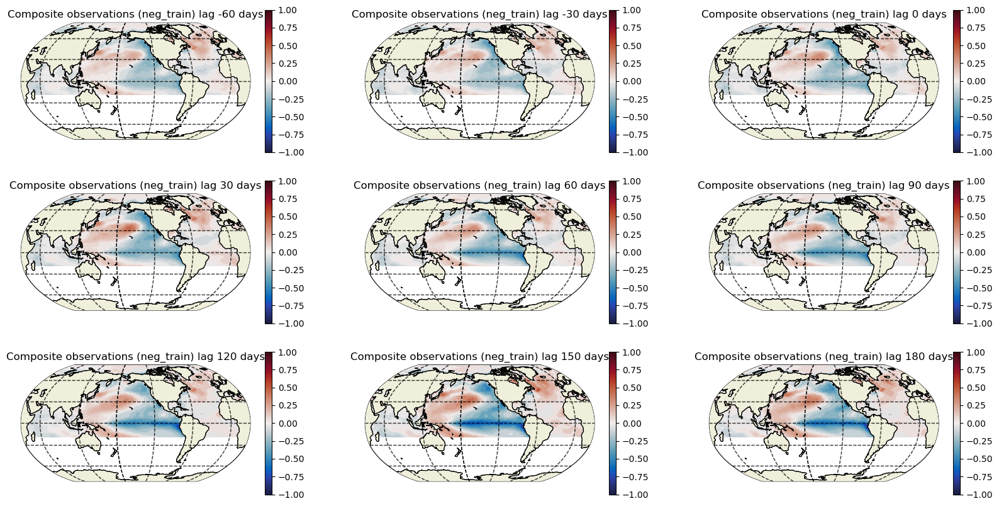

In [14]:
subplot_idx = 1
plt.rcParams["figure.figsize"] = (20,10)

for lag in lagStepsList:

    field = np.nanmean(LRPDict_theta[f'LRP{lag}']['samples_correct_neg_train'], axis=0)
    
    P = ecco.plot_proj_to_latlon_grid(ds.XC, ds.YC,
                                      field,
                                      plot_type = 'contourf',
                                      show_colorbar=True, cmap=cmocean.cm.balance, 
                                      cmin = -1, cmax = 1,
                                      user_lon_0 = -150,
                                      dx=2, dy=2, projection_type = 'robin',
                                      less_output = True, subplot_grid = [3,3,subplot_idx])

    P[1].set_title(f"Composite observations (neg_train) lag {lag} days")
    subplot_idx += 1

# plt.title("Composite observations (negative_train)")
plt.show()

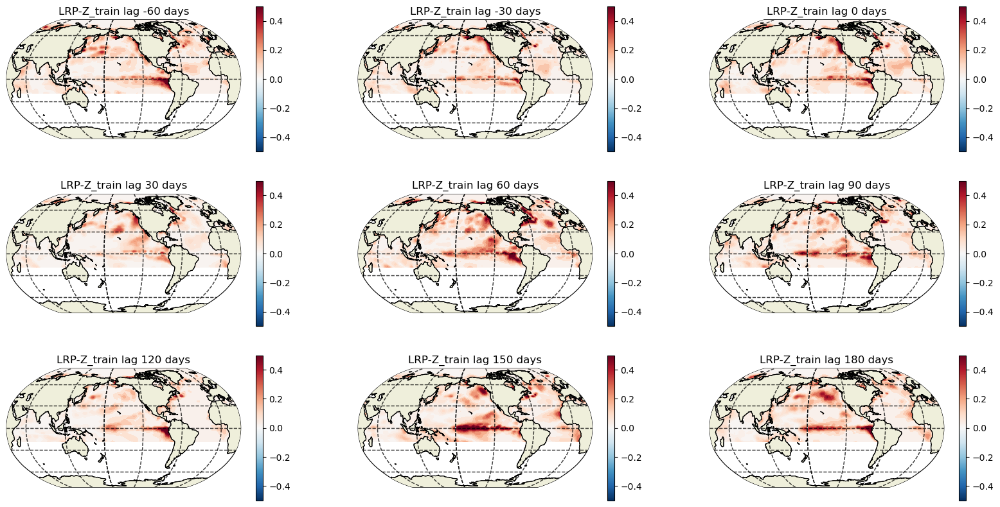

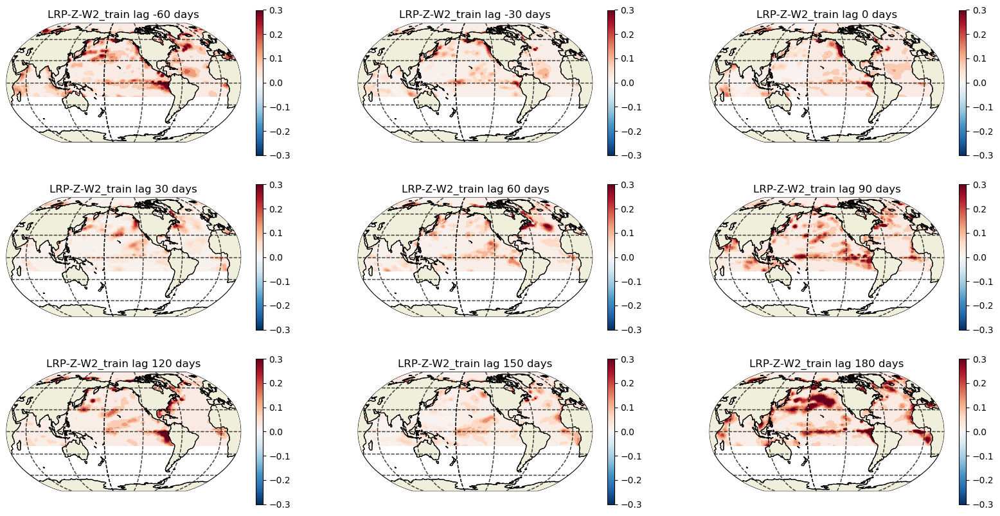

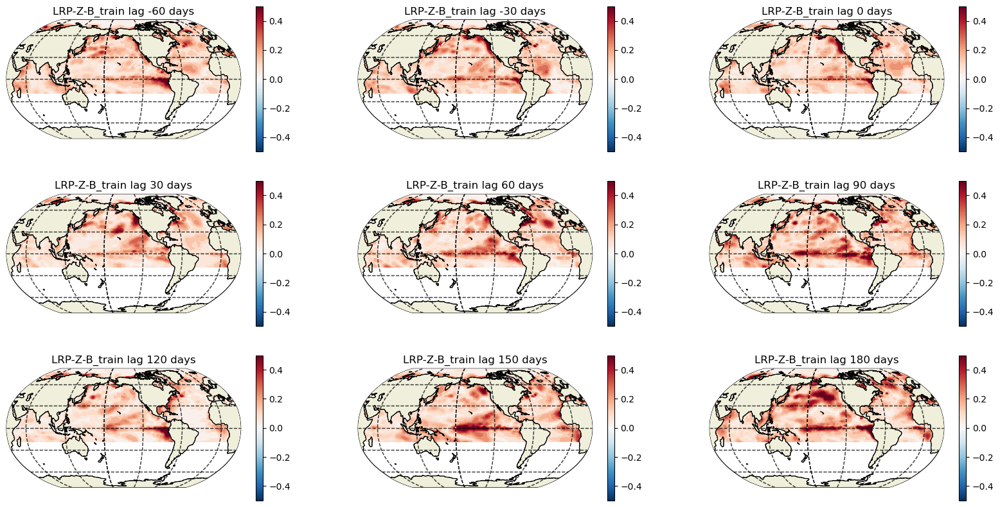

In [15]:
subplot_idx = 1
color_idx = 0

for method in methods:
    plt.rcParams["figure.figsize"] = (20,10)
    
    for lag in lagStepsList:

        field = LRPDict_theta[f'LRP{lag}'][method['title']+'_pos_train'].copy()
        field[np.where(field < 0)] = 0.0
        field = np.nanmean(field, axis=0)
        field = field / np.nanmax(np.abs(field))
        
        P = ecco.plot_proj_to_latlon_grid(ds.XC, ds.YC,
                                      field,
                                      plot_type = 'contourf',
                                      show_colorbar = True, 
                                      cmap = cmaps[color_idx], 
                                      cmin = color_ranges[color_idx][0], 
                                      cmax = color_ranges[color_idx][1],
                                      user_lon_0 = -150,
                                      dx=2, dy=2, projection_type = 'robin',
                                      less_output = True, subplot_grid = [3,3,subplot_idx])

        P[1].set_title(f"{method['title']}_train lag {lag} days")
        subplot_idx += 1

    subplot_idx = 1
    color_idx += 1
    # plt.title(f"{method['title']}_train for pos QoI' w/o neg relevances")
    plt.show()

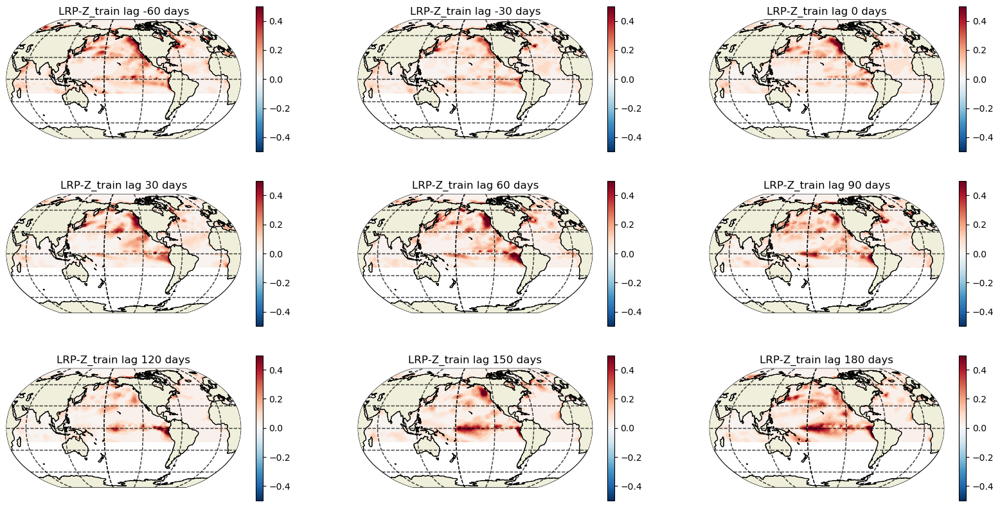

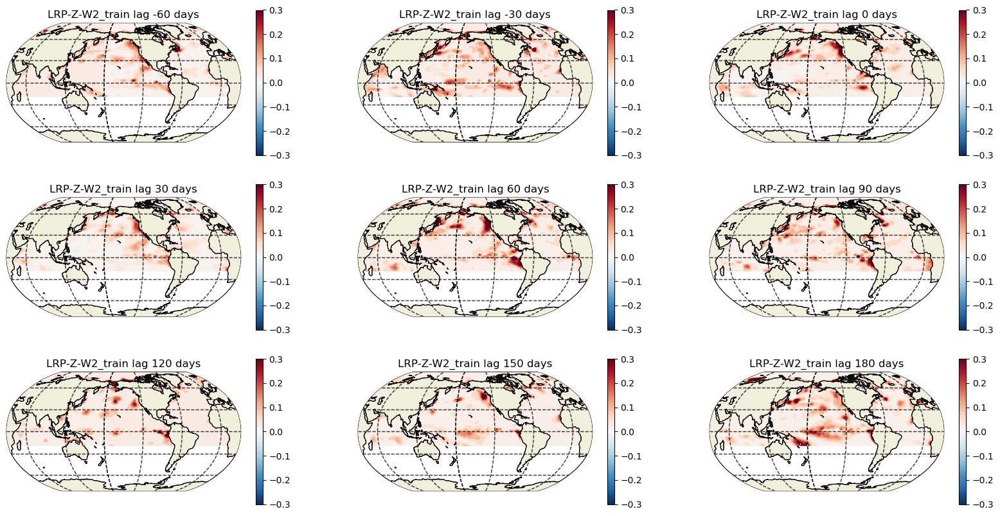

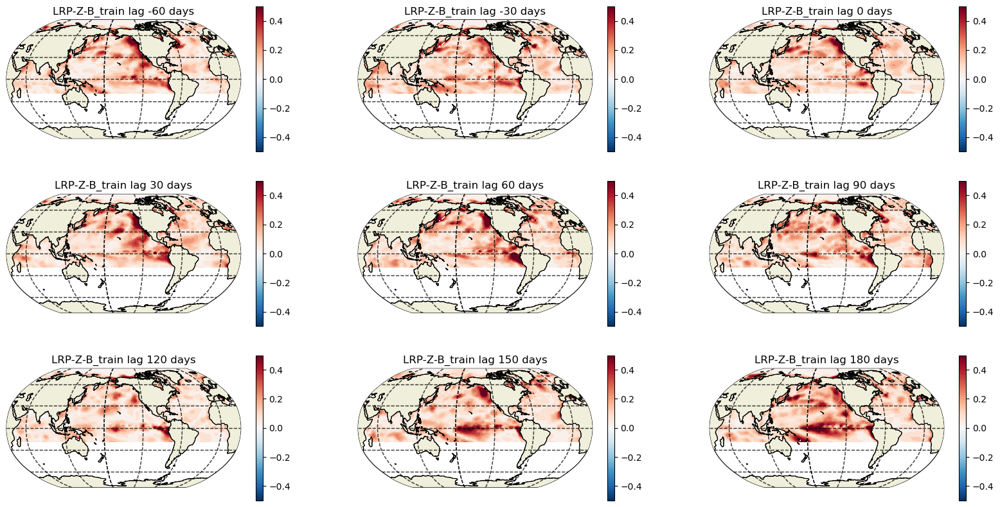

In [16]:
subplot_idx = 1
color_idx = 0

for method in methods:
    plt.rcParams["figure.figsize"] = (20,10)
    
    for lag in lagStepsList:

        field = LRPDict_theta[f'LRP{lag}'][method['title']+'_neg_train'].copy()
        field[np.where(field < 0)] = 0.0
        field = np.nanmean(field, axis=0)
        field = field / np.nanmax(np.abs(field))
        
        P = ecco.plot_proj_to_latlon_grid(ds.XC, ds.YC,
                                      field,
                                      plot_type = 'contourf',
                                      show_colorbar=True,
                                      cmap = cmaps[color_idx],
                                      cmin = color_ranges[color_idx][0], 
                                      cmax = color_ranges[color_idx][1],
                                      user_lon_0 = -150,
                                      dx=2, dy=2, projection_type = 'robin',
                                      less_output = True, subplot_grid = [3,3,subplot_idx])
        
        P[1].set_title(f"{method['title']}_train lag {lag} days")
        subplot_idx += 1
        
    subplot_idx = 1
    color_idx += 1
    # plt.title(f"{method['title']}_train for neg QoI' w/o neg relevances")
    plt.show()

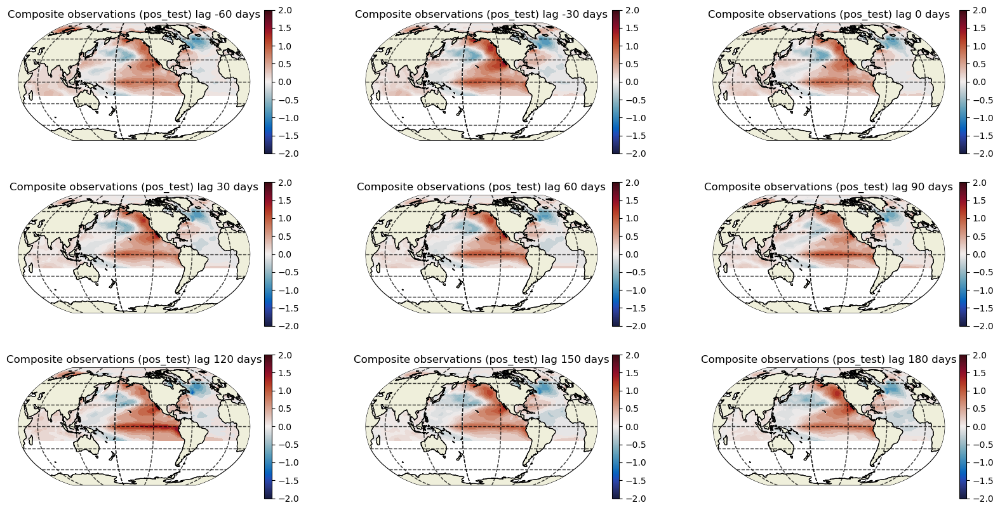

In [17]:
subplot_idx = 1
plt.rcParams["figure.figsize"] = (20,10)

for lag in lagStepsList:

    field = np.nanmean(LRPDict_theta[f'LRP{lag}']['samples_correct_pos_test'], axis=0)
    
    P = ecco.plot_proj_to_latlon_grid(ds.XC, ds.YC,
                                      field,
                                      plot_type = 'contourf',
                                      show_colorbar=True, cmap=cmocean.cm.balance, 
                                      cmin = -2, cmax = 2,
                                      user_lon_0 = -150,
                                      dx=2, dy=2, projection_type = 'robin',
                                      less_output = True, subplot_grid = [3,3,subplot_idx])

    P[1].set_title(f"Composite observations (pos_test) lag {lag} days")
    subplot_idx += 1

# plt.title("Composite observations (positive_test)")
plt.show()

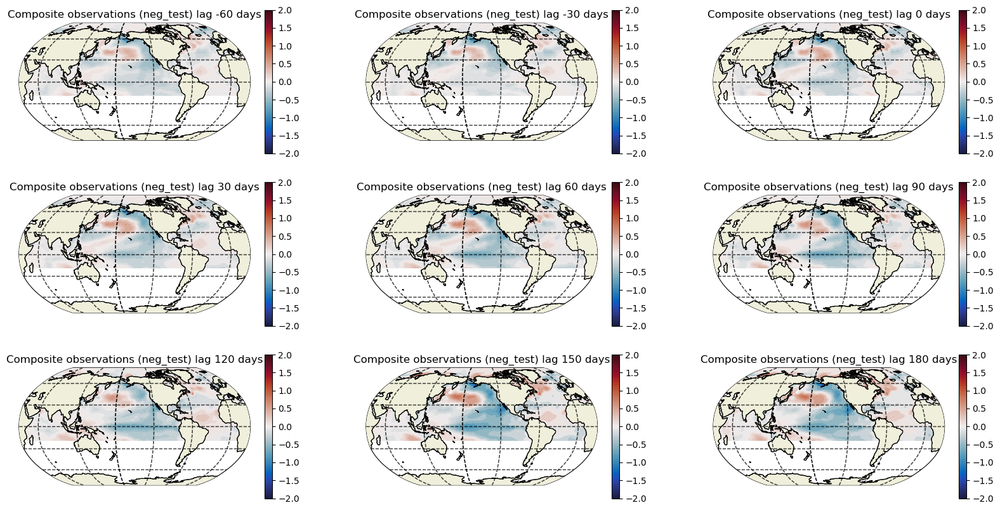

In [18]:
subplot_idx = 1
plt.rcParams["figure.figsize"] = (20,10)

for lag in lagStepsList:

    field = np.nanmean(LRPDict_theta[f'LRP{lag}']['samples_correct_neg_test'], axis=0)
    
    P = ecco.plot_proj_to_latlon_grid(ds.XC, ds.YC,
                                      field,
                                      plot_type = 'contourf',
                                      show_colorbar=True, cmap=cmocean.cm.balance, 
                                      cmin = -2, cmax = 2,
                                      user_lon_0 = -150,
                                      dx=2, dy=2, projection_type = 'robin',
                                      less_output = True, subplot_grid = [3,3,subplot_idx])

    P[1].set_title(f"Composite observations (neg_test) lag {lag} days")
    subplot_idx += 1

# plt.title("Composite observations (negative_test)")
plt.show()

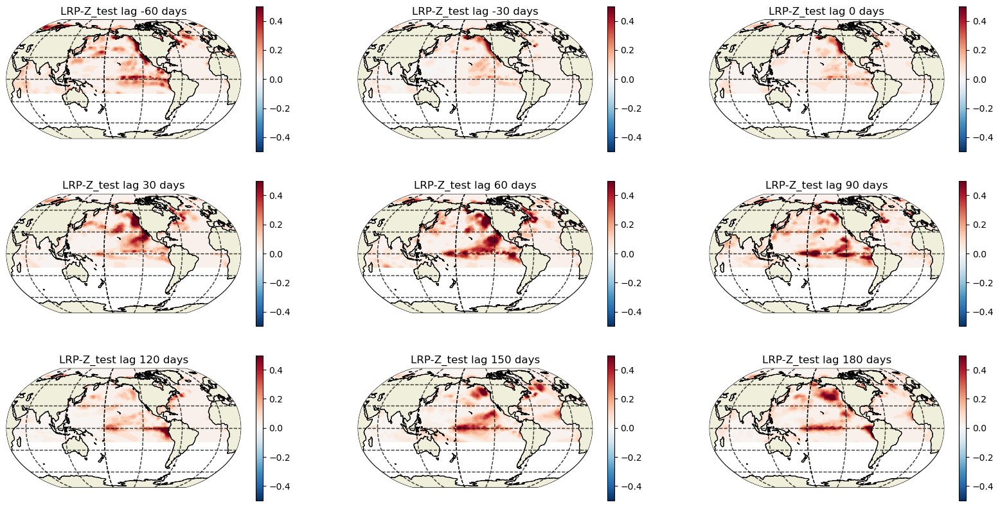

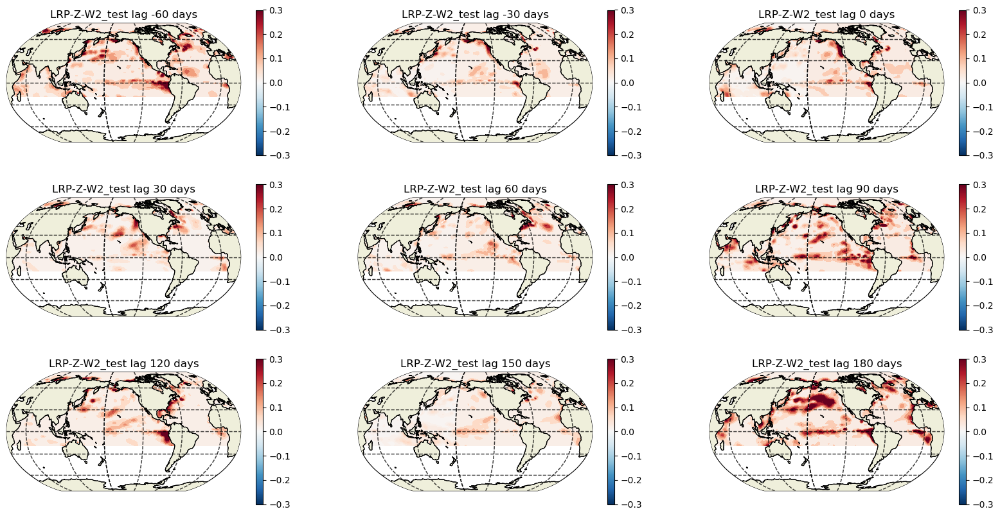

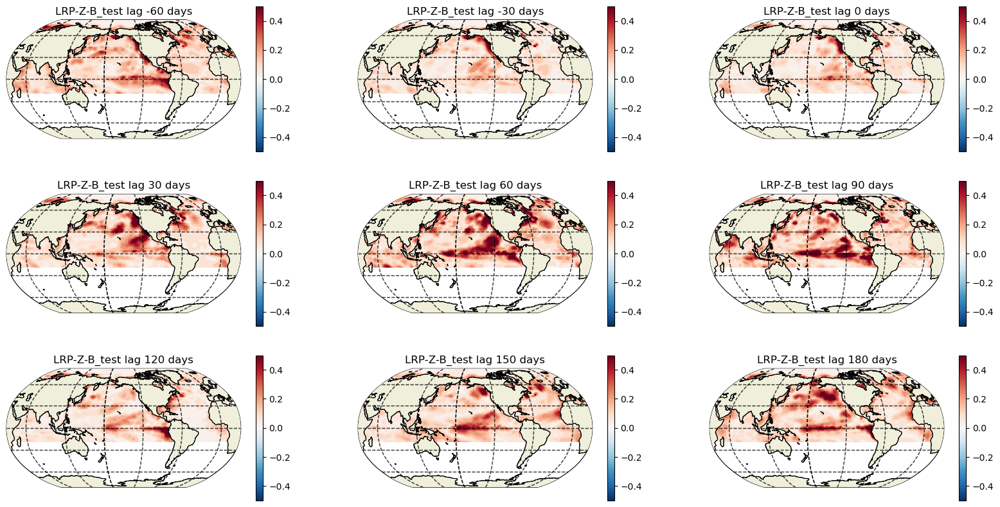

In [19]:
subplot_idx = 1
color_idx = 0

for method in methods:
    plt.rcParams["figure.figsize"] = (20,10)
    
    for lag in lagStepsList:

        field = LRPDict_theta[f'LRP{lag}'][method['title']+'_pos_test'].copy()
        field[np.where(field < 0)] = 0.0
        field = np.nanmean(field, axis=0)
        field = field / np.nanmax(np.abs(field))
        
        P = ecco.plot_proj_to_latlon_grid(ds.XC, ds.YC,
                                      field,
                                      plot_type = 'contourf',
                                      show_colorbar = True,
                                      cmap = cmaps[color_idx], 
                                      cmin = color_ranges[color_idx][0], 
                                      cmax = color_ranges[color_idx][1],
                                      user_lon_0 = -150,
                                      dx=2, dy=2, projection_type = 'robin',
                                      less_output = True, subplot_grid = [3,3,subplot_idx])

        P[1].set_title(f"{method['title']}_test lag {lag} days")
        subplot_idx += 1
        
    subplot_idx = 1
    color_idx += 1
    # plt.title(f"{method['title']}_test for pos QoI' w/o neg relevances")
    plt.show()

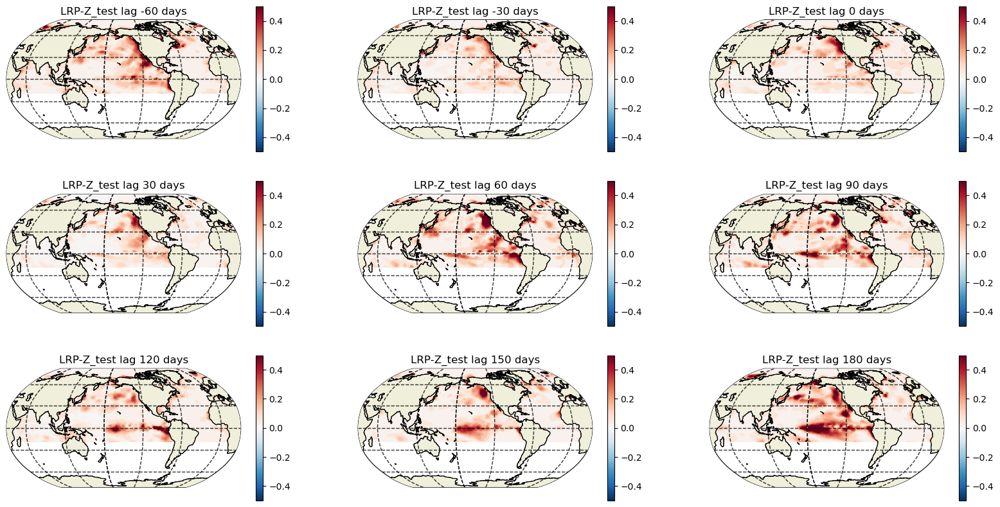

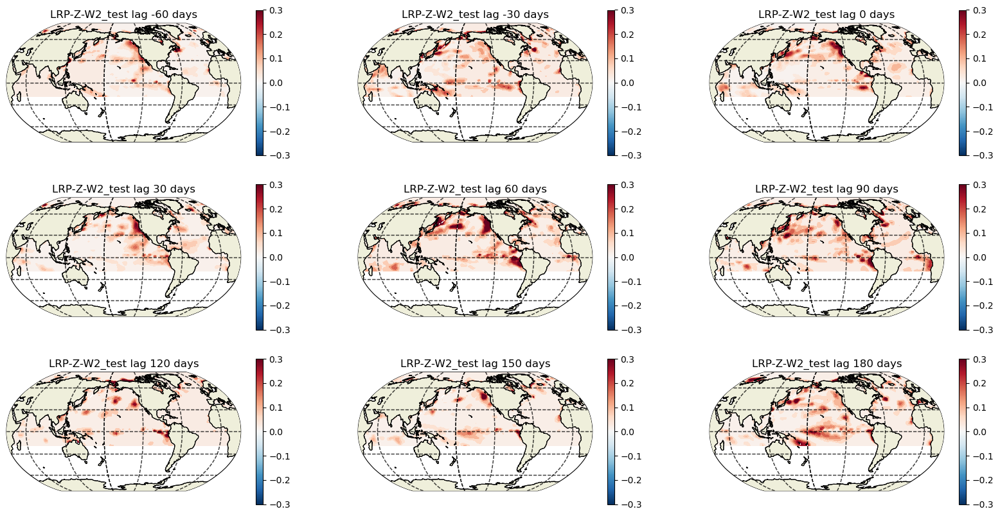

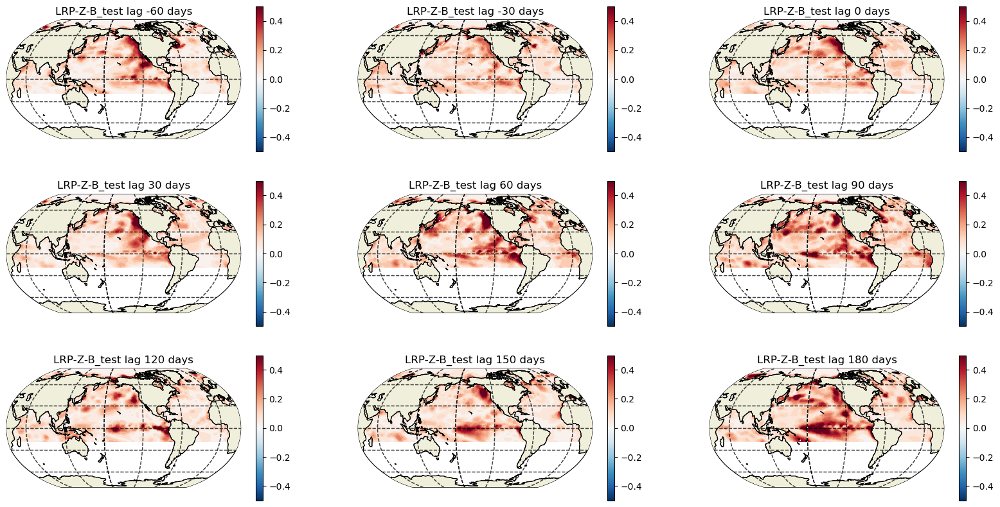

In [20]:
subplot_idx = 1
color_idx = 0

for method in methods:
    plt.rcParams["figure.figsize"] = (20,10)
    
    for lag in lagStepsList:

        field = LRPDict_theta[f'LRP{lag}'][method['title']+'_neg_test'].copy()
        field[np.where(field < 0)] = 0.0
        field = np.nanmean(field, axis=0)
        field = field / np.nanmax(np.abs(field))
        
        P = ecco.plot_proj_to_latlon_grid(ds.XC, ds.YC,
                                      field,
                                      plot_type = 'contourf',
                                      show_colorbar = True,
                                      cmap = cmaps[color_idx], 
                                      cmin = color_ranges[color_idx][0], 
                                      cmax = color_ranges[color_idx][1],
                                      user_lon_0 = -150,
                                      dx=2, dy=2, projection_type = 'robin',
                                      less_output = True, subplot_grid = [3,3,subplot_idx])
        
        P[1].set_title(f"{method['title']}_test lag {lag} days")
        subplot_idx += 1
        
    subplot_idx = 1
    color_idx += 1
    # plt.title(f"{method['title']}_test for neg QoI' w/o neg relevances")
    plt.show()